# (a)

In [25]:
# Librerías
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
import geopandas as gpd
import plotly.express as px
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [5]:
# Se importa la base de datos
ruta = r"IMM_2020.xls"
data = pd.read_excel(ruta, sheet_name='IMM_2020')

# Se crea una data frame con las variables de interés
val = data.iloc[:,[5,6,7,8,9,10,11,12,13]]
data

,CVE_ENT,NOM_ENT,CVE_MUN,NOM_MUN,POB_TOT,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,IM_2020,GM_2020,IMN_2020
0,1,Aguascalientes,1001,Aguascalientes,948990,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594,60.318795,Muy bajo,0.944508
1,1,Aguascalientes,1002,Asientos,51536,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471,56.546071,Muy bajo,0.885433
2,1,Aguascalientes,1003,Calvillo,58250,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777,57.058251,Muy bajo,0.893453
3,1,Aguascalientes,1004,Cosío,17000,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369,57.114030,Muy bajo,0.894326
4,1,Aguascalientes,1005,Jesús María,129929,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753,59.011762,Muy bajo,0.924042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2464,32,Zacatecas,32054,Villa Hidalgo,19446,7.497894,36.678176,3.010808,0.452908,2.254246,1.137416,21.932484,100.000000,90.877128,55.044146,Bajo,0.861915
2465,32,Zacatecas,32055,Villanueva,31558,4.199744,44.806459,2.536486,0.551254,1.073864,0.895418,15.269627,56.774827,81.912592,56.747058,Muy bajo,0.888580
2466,32,Zacatecas,32056,Zacatecas,149607,1.442438,19.436229,0.294739,0.163292,1.278559,0.484463,9.340958,7.461549,57.885307,60.176191,Muy bajo,0.942275
2467,32,Zacatecas,32057,Trancoso,20455,5.119108,31.992586,3.066130,0.500392,2.860086,1.344192,23.544577,16.788071,83.056133,56.958073,Muy bajo,0.891884


In [7]:
val

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM
0,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594
1,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471
2,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777
3,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369
4,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753
...,...,...,...,...,...,...,...,...,...
2464,7.497894,36.678176,3.010808,0.452908,2.254246,1.137416,21.932484,100.000000,90.877128
2465,4.199744,44.806459,2.536486,0.551254,1.073864,0.895418,15.269627,56.774827,81.912592
2466,1.442438,19.436229,0.294739,0.163292,1.278559,0.484463,9.340958,7.461549,57.885307
2467,5.119108,31.992586,3.066130,0.500392,2.860086,1.344192,23.544577,16.788071,83.056133


In [9]:
# Se estandariza el data frame com las variables de interés 
x = StandardScaler().fit_transform(val)
cov= np.cov(x.T)

# Se calculan los valores propios y vectores propios 
valoresp, vectoresp = np.linalg.eig(cov)

# Se ordenan los valores y vectores propios del mayor al menor
indices = valoresp.argsort()[::-1]
eigval = valoresp[indices]
eigvec = vectoresp[:,indices]

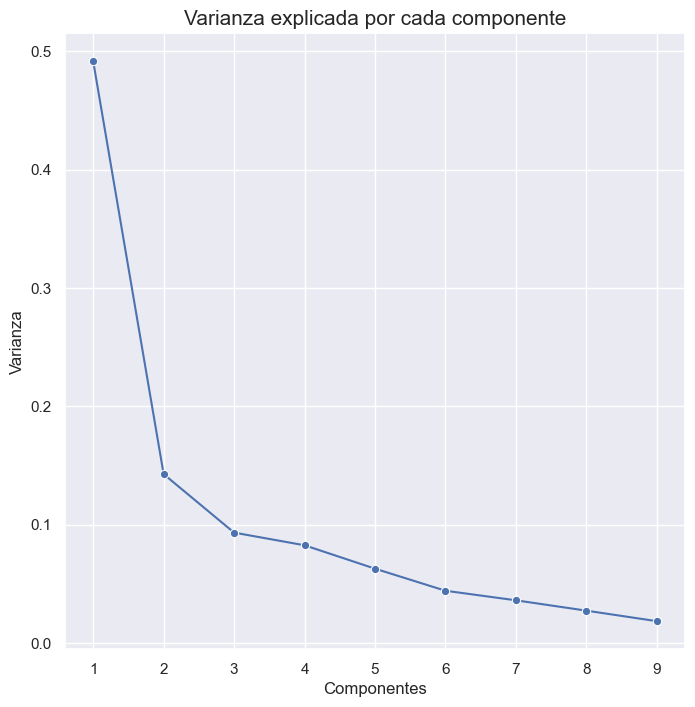

In [166]:
# Data frame con la varianza, varianza propia y varianza acumulada de los valores propios 
dat = {'Componentes':range(1,10),'std':np.sqrt(eigval), 'Varianza':eigval/sum(eigval),'Varianza acumulada':np.cumsum(eigval/sum(eigval))}
stds = pd.DataFrame(data = dat)

# Grafico de componentes principales de acuerdo a la varianza que toman 
plt.figure(figsize=(8, 8))
sns.lineplot(x="Componentes", y="Varianza", data=stds, marker="o")
plt.title('Varianza explicada por cada componente', fontsize=15)
#plt.savefig("std_vs_pcs.png", dpi=300, bbox_inches="tight")
plt.show()

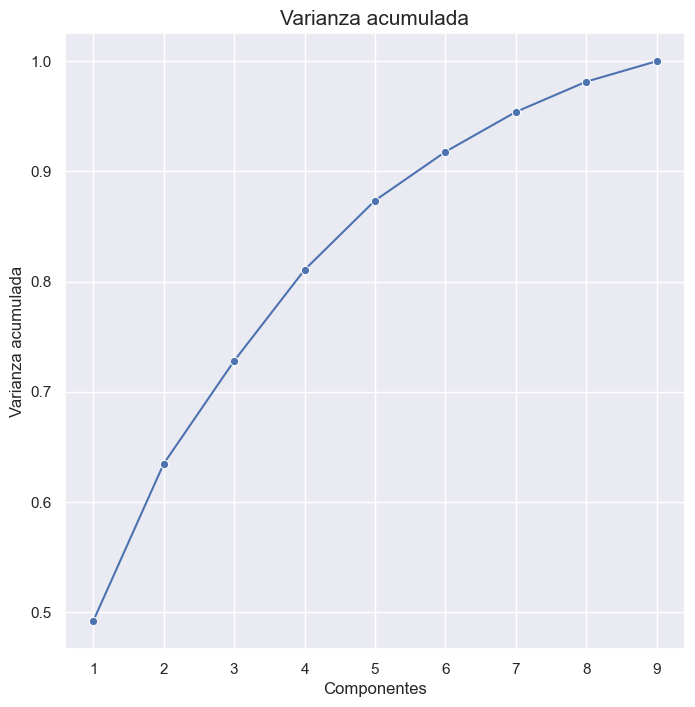

In [168]:
# Grafica de los componentes con la varianza acumulada 
plt.figure(figsize=(8, 8))
sns.lineplot(x="Componentes", y="Varianza acumulada", data=stds, marker="o")
plt.title('Varianza acumulada', fontsize=15)
#plt.savefig("varianza_acumulada_vs_pcs", dpi=300, bbox_inches="tight")
plt.show()

In [15]:
# Data fraame de los componenntes vectores propios 
componentes = pd.DataFrame(data = eigvec.T, columns = val.columns, index = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9'])
componentes.T

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
ANALF,-0.411104,-0.108659,-0.093362,-0.183637,-0.005263,0.551280,0.093652,-0.193382,-0.653179
SBASC,-0.394736,-0.291060,0.111403,0.019709,-0.069394,0.505365,-0.178865,0.009322,0.674076
OVSDE,-0.237374,0.509972,0.499260,-0.170189,0.505338,0.083915,0.184955,0.327640,0.037319
OVSEE,-0.265188,0.561235,0.226750,0.167457,-0.469933,-0.091366,-0.451798,-0.315203,-0.050731
OVSAE,-0.238413,0.277631,-0.578108,0.624842,0.365806,0.056789,0.028145,-0.000852,0.060100
OVPT,-0.371528,0.118576,-0.273067,-0.140136,-0.535142,-0.170185,0.390192,0.532407,0.051535
VHAC,-0.363212,0.021881,-0.247235,-0.501820,0.230906,-0.411993,0.111150,-0.519737,0.221614
PL.5000,-0.295071,-0.331886,0.455509,0.496940,-0.048234,-0.287226,0.452082,-0.232178,-0.072366
PO2SM,-0.366936,-0.355886,0.028442,0.006630,0.207650,-0.375342,-0.592564,0.385130,-0.233225


In [17]:
# Data frame de los componentes vectores propios usando la función: pca.components
x = pd.DataFrame(x)
pca = PCA()
pca.fit(x)

comps = pd.DataFrame(data=pca.components_.T, columns=['pc1','pc2','pc3','pc4','pc5','pc6','pc7','pc8','pc9'], index=val.columns)


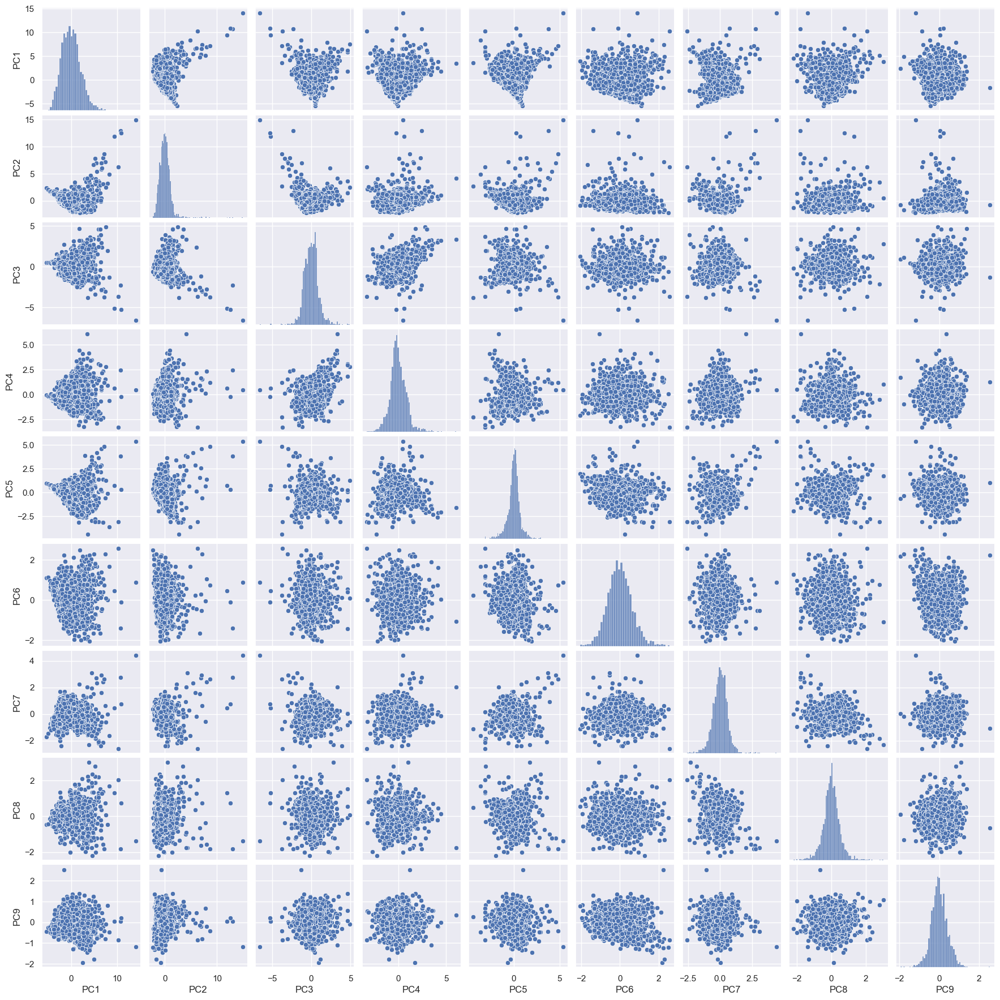

In [19]:
# Grafico de la proyección en los componentes principales
proj = pd.DataFrame(pca.transform(x),columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9'])
sns.set()
sns.pairplot(proj, height=2);


In [31]:
proj

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-3.847822,1.199462,0.410835,-0.214396,0.468788,0.591210,-0.430477,0.027735,-0.237013
1,-1.391098,-0.135314,-0.569230,0.133093,-0.221698,-0.605612,-0.162437,-0.142453,-0.087693
2,-1.542479,-0.322899,-0.166443,-0.004166,0.060904,0.084595,0.453088,0.057919,0.188033
3,-1.700064,-0.154769,-0.219273,0.025750,-0.131550,-0.874197,0.184171,-0.088426,-0.413830
4,-3.021976,0.804573,0.138147,-0.061204,0.413184,0.299506,-0.675334,-0.371660,0.025509
...,...,...,...,...,...,...,...,...,...
2464,-0.529294,-0.760038,-0.827796,0.487256,-0.477723,-0.727844,0.159482,0.079084,-0.591527
2465,-1.398222,-0.283976,-0.553057,0.224962,-0.101748,0.210275,0.525775,0.433140,0.194452
2466,-3.774185,1.164255,0.415447,-0.102902,0.369859,0.475130,-0.241881,0.200444,-0.351858
2467,-1.642171,0.429154,0.346940,-0.676853,-0.523185,-0.206688,0.781822,0.360571,-0.250497


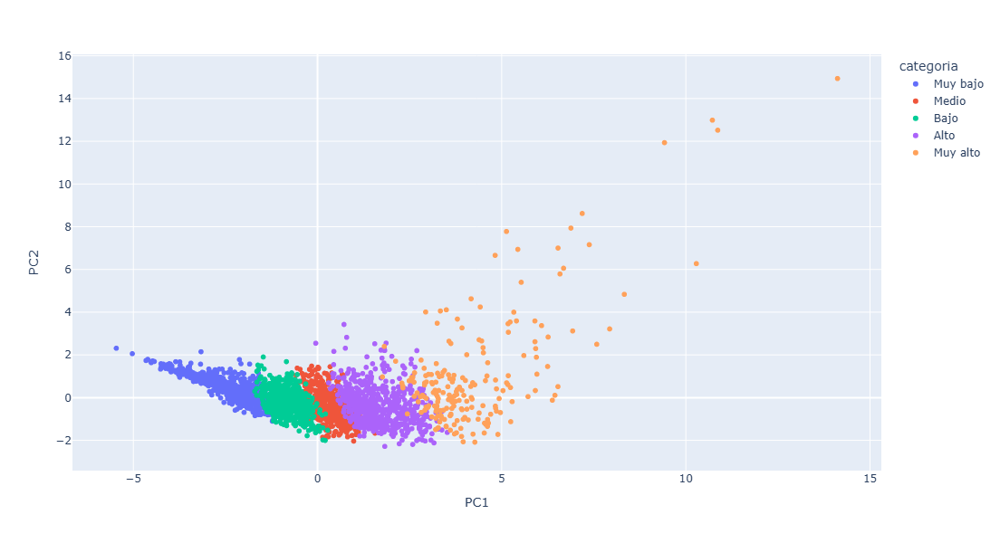

In [23]:
import plotly.express as px

# Gráfico de las primeras dos componentes pricipales 
pca_dataset = pd.DataFrame({'PC1': proj['PC1'], 'PC2': proj['PC2'], 'mun': val.index})
pca_dataset['categoria'] = data['GM_2020']
fig = px.scatter(pca_dataset, x='PC1', y='PC2', color='categoria', hover_data=['mun'])

fig.update_layout(
    autosize=False,
    width=600,
    height=600,
)

fig.show()
#fig.write_image('pc1_vs_pc2.png')

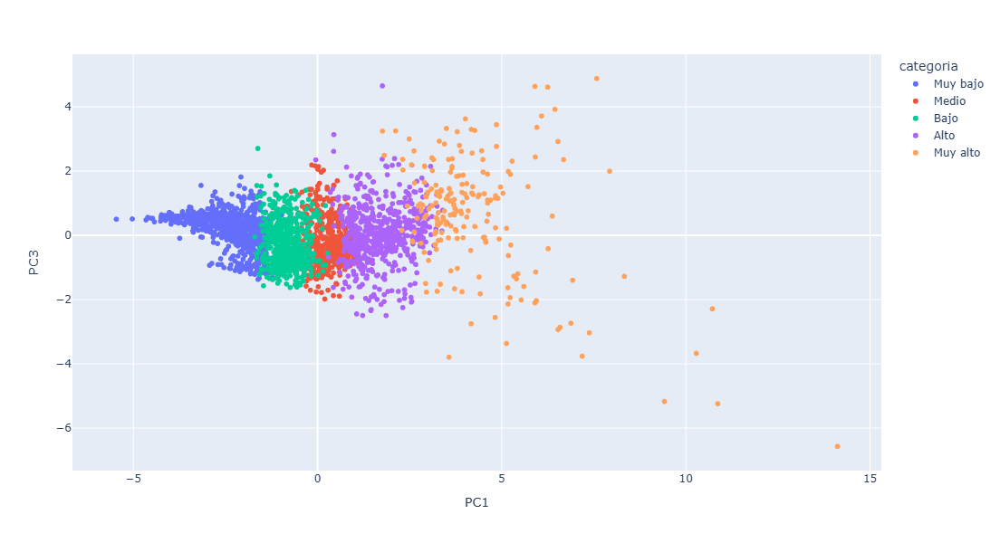

In [25]:
# Gráfico de PC1 vs PC3
pca_dataset2 = pd.DataFrame({'PC1': proj['PC1'], 'PC3': proj['PC3'], 'mun': val.index})
pca_dataset2['categoria'] = data['GM_2020']
fig = px.scatter(pca_dataset2, x='PC1', y='PC3', color='categoria', hover_data=['mun'])

fig.update_layout(
    autosize=False,
    width=600,
    height=600,
)


fig.show()
#fig.write_image('pc1_vs_pc3.png')

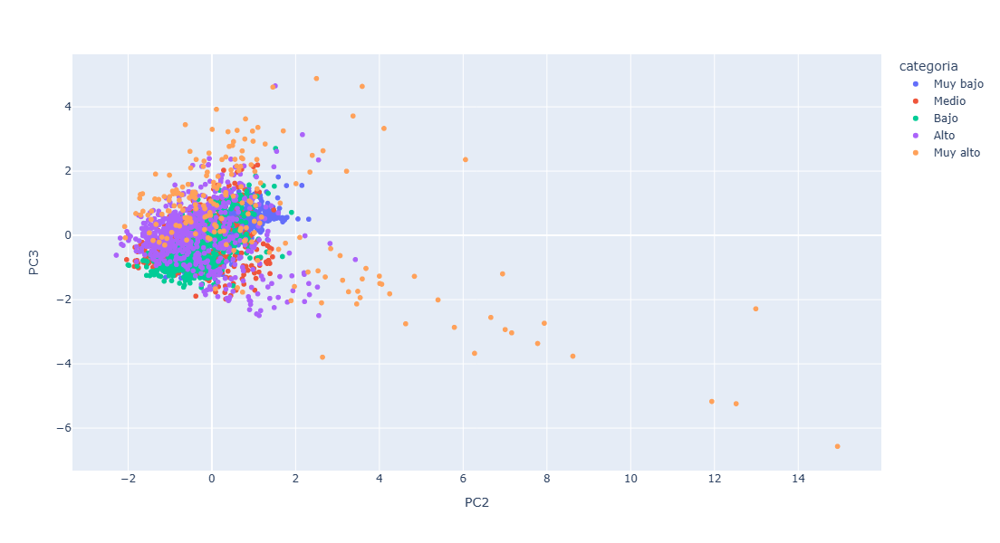

In [27]:
# Gráfico de PC2 vs PC3
pca_dataset3 = pd.DataFrame({'PC2': proj['PC2'], 'PC3': proj['PC3'], 'mun': val.index})
pca_dataset3['categoria'] = data['GM_2020']
fig = px.scatter(pca_dataset3, x='PC2', y='PC3', color='categoria', hover_data=['mun'])

fig.update_layout(
    autosize=False,
    width=600,
    height=600,
)

fig.show()

#fig.write_image('pc2_vs_pc3.png')

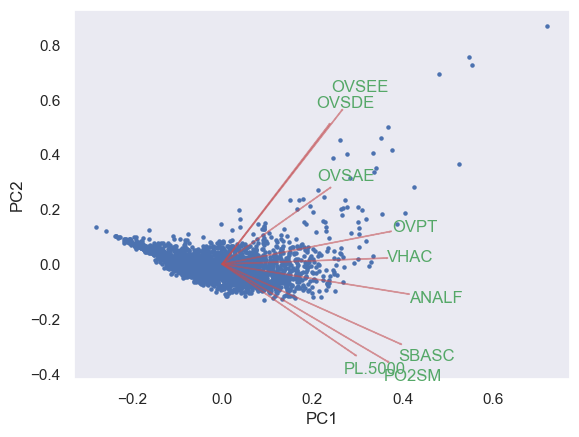

In [29]:
# Biplot
from sklearn.decomposition import PCA

PCA = PCA(n_components=9)
components = PCA.fit_transform(x)
PCA.components_

def biplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,s=5)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

componentsDf = pd.DataFrame(data = components, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9'])
components = PCA.fit_transform(x)
#componentsDf
#plt.figure(figsize=(12, 6))
biplot(components, np.transpose(PCA.components_), list(val.columns))
ruta_completa = r"biplot.png"
#plt.savefig(ruta_completa)

In [78]:
# Normlización de las proyecciones [0,1]
proj_normalized = pd.DataFrame(MinMaxScaler().fit_transform(proj), columns=proj.columns)
proj_normalized.head(15)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,0.082497,0.202184,0.609525,0.329525,0.499526,0.570895,0.308639,0.426893,0.381451
1,0.207969,0.124668,0.523943,0.366728,0.429014,0.313031,0.346965,0.394160,0.414694
2,0.200237,0.113774,0.559115,0.352033,0.457873,0.461741,0.434975,0.432698,0.476078
3,0.192189,0.123538,0.554502,0.355235,0.438220,0.255162,0.396524,0.404551,0.342087
4,0.124675,0.179251,0.585713,0.345926,0.493848,0.508045,0.273628,0.350075,0.439896
5,0.138978,0.171767,0.592291,0.327026,0.467416,0.442554,0.333655,0.370762,0.403578
6,0.173256,0.145641,0.577843,0.331778,0.444351,0.342472,0.395051,0.422228,0.355344
7,0.174855,0.160927,0.570813,0.331428,0.436126,0.349419,0.401563,0.417027,0.398800
8,0.206549,0.120825,0.537126,0.369078,0.445882,0.341494,0.346925,0.365772,0.419881
9,0.204431,0.137967,0.535601,0.369874,0.444316,0.360811,0.362427,0.385135,0.423881


Las primeras tres componentes principales que ahora funcionan como nuestros índices fueron guardados en los archivos **MNN_2020_1**, **MNN_2020_2**, **MNN_2020_3** para su posterior uso. 

# (b)

## Indice CONAPO 
### escala [0,1]

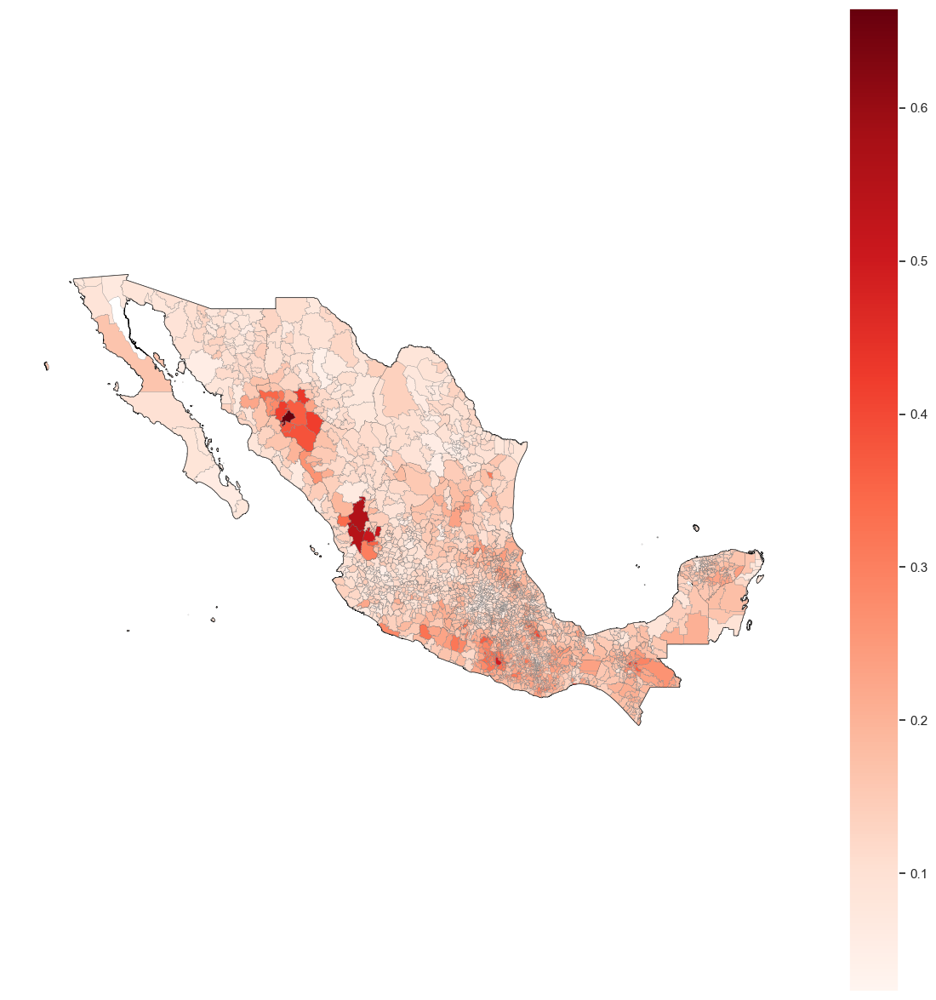

In [170]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os

# Lee la cartografía
base = gpd.read_file(r'national\national\national_estatal.shp')
layer = gpd.read_file(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = layer.to_crs("EPSG:4326")
base = base.to_crs("EPSG:4326")  # asegurarse de mismo CRS

# Datos del índice de marginación
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x: 'str' for x in lst_str_cols}
marg_municipal = pd.read_excel('IMM_2020.xls', sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')

# Une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO', right_on='CVE_MUN')

# Supongamos que el índice numérico se llama 'IMN_2020'
# Asegúrate de usar la columna correcta que contenga valores de 0 a 1
#layer_marg['IMN_2020'] = pd.to_numeric(layer_marg['IMN_2020'], errors='coerce')
layer_marg['IMN_2020'] = 1-pd.to_numeric(layer_marg['IMN_2020'], errors='coerce')
# Grafica
fig, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')

# Mapa de entidades (borde)
base.plot(color='white', edgecolor='black', ax=ax)

# Mapa de municipios con índice continuo
layer_marg.plot(column='IMN_2020', cmap='Reds', legend=True, linewidth=0.2, edgecolor='grey', ax=ax)

# Quitar ejes
ax.set_axis_off()
#plt.savefig("mexico_conapo.png", dpi=300, bbox_inches="tight")
plt.show()


### categorico

C:\Users\a-sal\anaconda3\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver ESRI Shapefile does not support open option INDEX_COL
  return ogr_read(


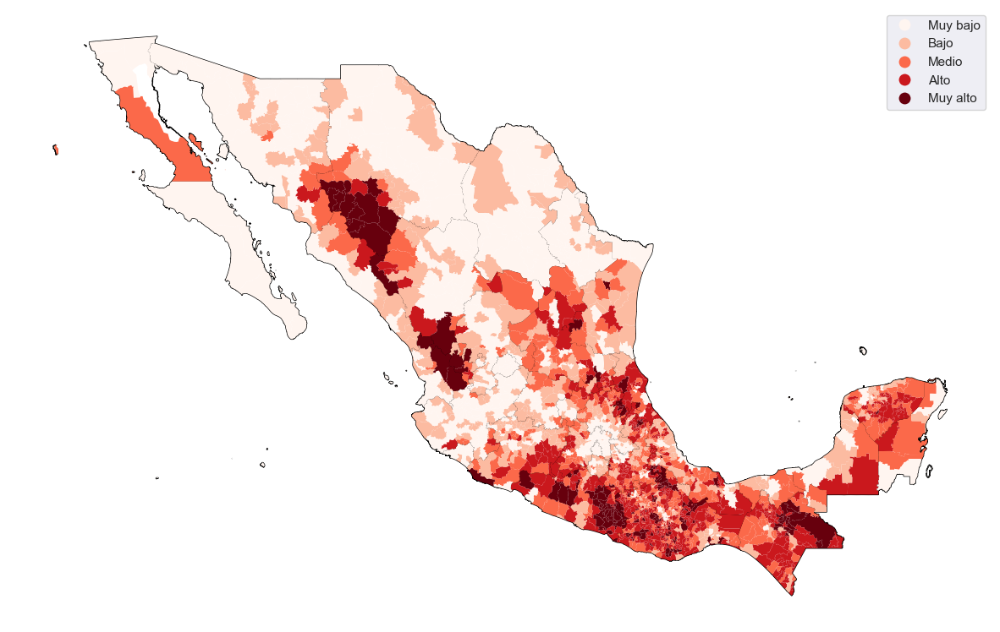

In [172]:
####################### Ejemplo dado del mapa de méxico dado por la CONAPO 

# lee la cartografía de entidades y municipios de México
fileindex = os.path.join(r'national\national\national_estatal.shp')
base = gpd.read_file(fileindex)
fileindex = os.path.join(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = gpd.read_file(fileindex, index_col='CVEGEO')
layer = layer.to_crs("EPSG:4326") # corrige el sistema de coordenadas de referencia para los municipios

# datos del índice de marginación
fileindex = os.path.join('IMM_2020.xls')
# especifica el tipo de variable string para los códigos de entidades y municipios
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x : 'str'  for x in lst_str_cols}
marg_municipal = pd.read_excel(fileindex,sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')
# une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO',right_on='CVE_MUN')
# especifica la variable GM_2020 como categórica (el IM en 5 niveles)
im_cat = pd.CategoricalIndex(layer_marg['GM_2020'], categories=['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto'])

# grafica el indicador a nivel municipal
f, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')
# mapa de las entidades de México
base.plot(color='white', edgecolor='black', ax=ax) 
# mapa de los municipios con su IM
layer_marg.plot(column='GM_2020', categorical=True, legend=True, linewidth=0, ax=ax, cmap="Reds", 
           categories = ['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto']) 
# Remove axis
ax.set_axis_off()
#plt.savefig("mexico_conapo_c.png", dpi=300, bbox_inches="tight")
plt.show()



## Primera componente como indice
### escala [0,1]

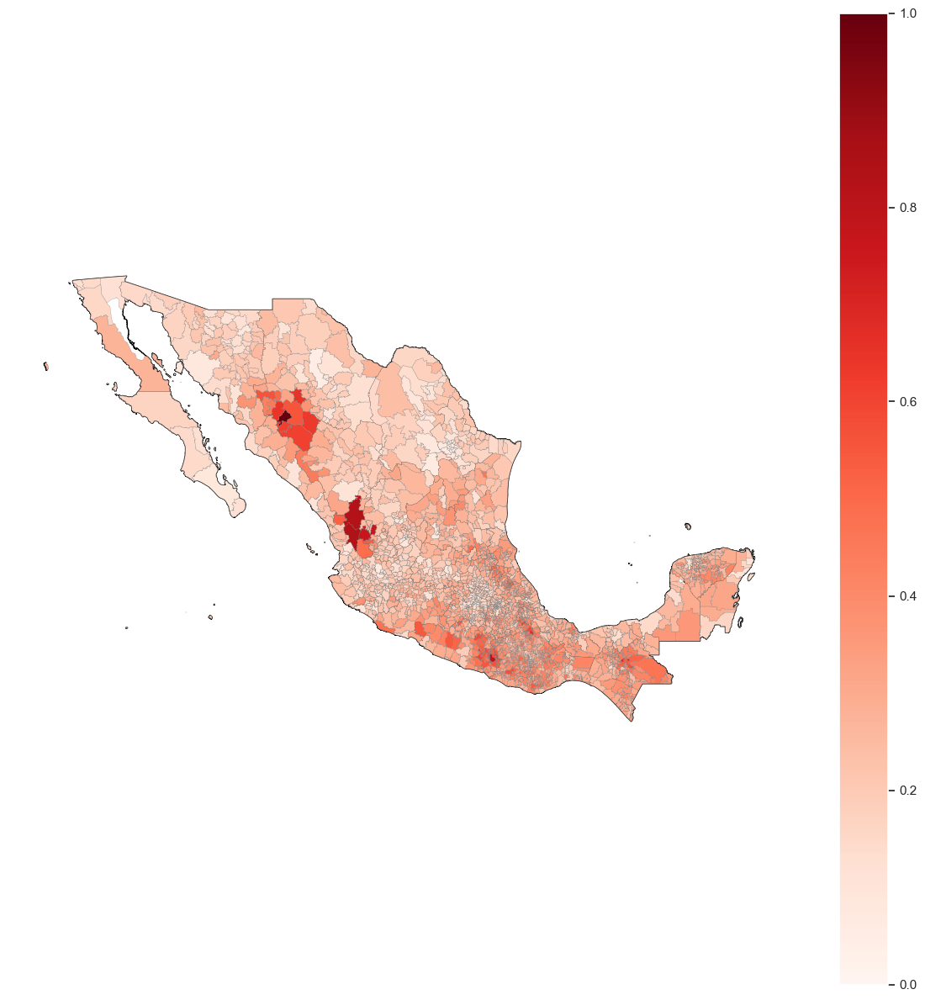

In [180]:
# Lee la cartografía
base = gpd.read_file(r'national\national\national_estatal.shp')
layer = gpd.read_file(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = layer.to_crs("EPSG:4326")
base = base.to_crs("EPSG:4326")  # asegurarse de mismo CRS

# Datos del índice de marginación
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x: 'str' for x in lst_str_cols}
marg_municipal = pd.read_excel('IMM_2020_1.xls', sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')

# Une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO', right_on='CVE_MUN')
# Supongamos que el índice numérico se llama 'IMN_2020'
# Asegúrate de usar la columna correcta que contenga valores de 0 a 1
#layer_marg['IMN_2020'] = pd.to_numeric(layer_marg['IMN_2020'], errors='coerce')
layer_marg['IMN 2020'] = pd.to_numeric(layer_marg['IMN 2020'], errors='coerce')

# Grafica
fig, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')

# Mapa de entidades (borde)
base.plot(color='white', edgecolor='black', ax=ax)

# Mapa de municipios con índice continuo
layer_marg.plot(column='IMN 2020', cmap='Reds', legend=True, linewidth=0.2, edgecolor='grey', ax=ax)

# Quitar ejes
ax.set_axis_off()
#plt.savefig("mexico_pc1.png", dpi=300, bbox_inches="tight")
plt.show()

### categorico

C:\Users\a-sal\anaconda3\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver ESRI Shapefile does not support open option INDEX_COL
  return ogr_read(


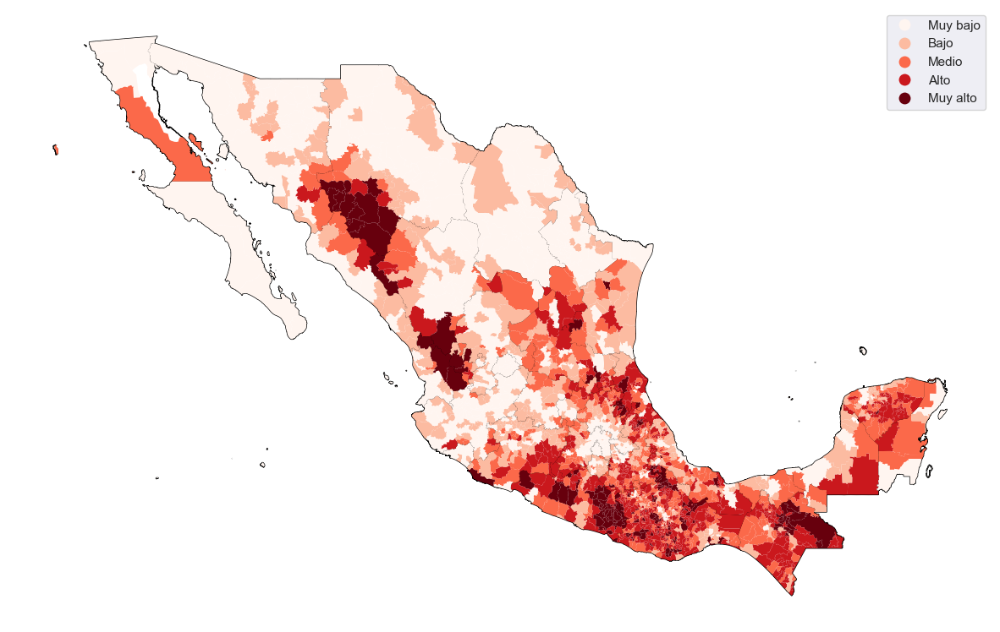

In [182]:
# lee la cartografía de entidades y municipios de México
fileindex = os.path.join(r'national\national\national_estatal.shp')
base = gpd.read_file(fileindex)
fileindex = os.path.join(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = gpd.read_file(fileindex, index_col='CVEGEO')
layer = layer.to_crs("EPSG:4326") # corrige el sistema de coordenadas de referencia para los municipios

# datos del índice de marginación
fileindex = os.path.join('IMM_2020_1.xls')
# especifica el tipo de variable string para los códigos de entidades y municipios
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x : 'str'  for x in lst_str_cols}
marg_municipal = pd.read_excel(fileindex,sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')
# une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO',right_on='CVE_MUN')

for i in range(len(layer_marg['IMN 2020'])):
    if 1 - layer_marg.iloc[i]['IMN 2020'] > 0.87:
        layer_marg.iloc[i]['GM_2020'] == 'Muy bajo'
    elif  0.84 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.87:
        layer_marg.iloc[i]['GM_2020'] == 'Bajo'
    elif 0.82 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.84:
        layer_marg.iloc[i]['GM_2020'] == 'Medio'
    elif 0.763 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.82:
        layer_marg.iloc[i]['GM_2020'] == 'Alto'
    elif 1- layer_marg.iloc[i]['IMN 2020'] <= 0.763:
        layer_marg.iloc[i]['GM_2020'] == 'Muy alto'

# especifica la variable GM_2020 como categórica (el IM en 5 niveles)
im_cat = pd.CategoricalIndex(layer_marg['GM_2020'], categories=['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto'])
# grafica el indicador a nivel municipal
f, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')
# mapa de las entidades de México
base.plot(color='white', edgecolor='black', ax=ax) 
# mapa de los municipios con su IM
layer_marg.plot(column='GM_2020', categorical=True, legend=True, linewidth=0, ax=ax, cmap="Reds", 
           categories = ['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto']) 
# Remove axis
ax.set_axis_off()
#plt.savefig("mexico_pc1_c.png", dpi=300, bbox_inches="tight")
plt.show()


## Segunda componente 
### escala [0,1]

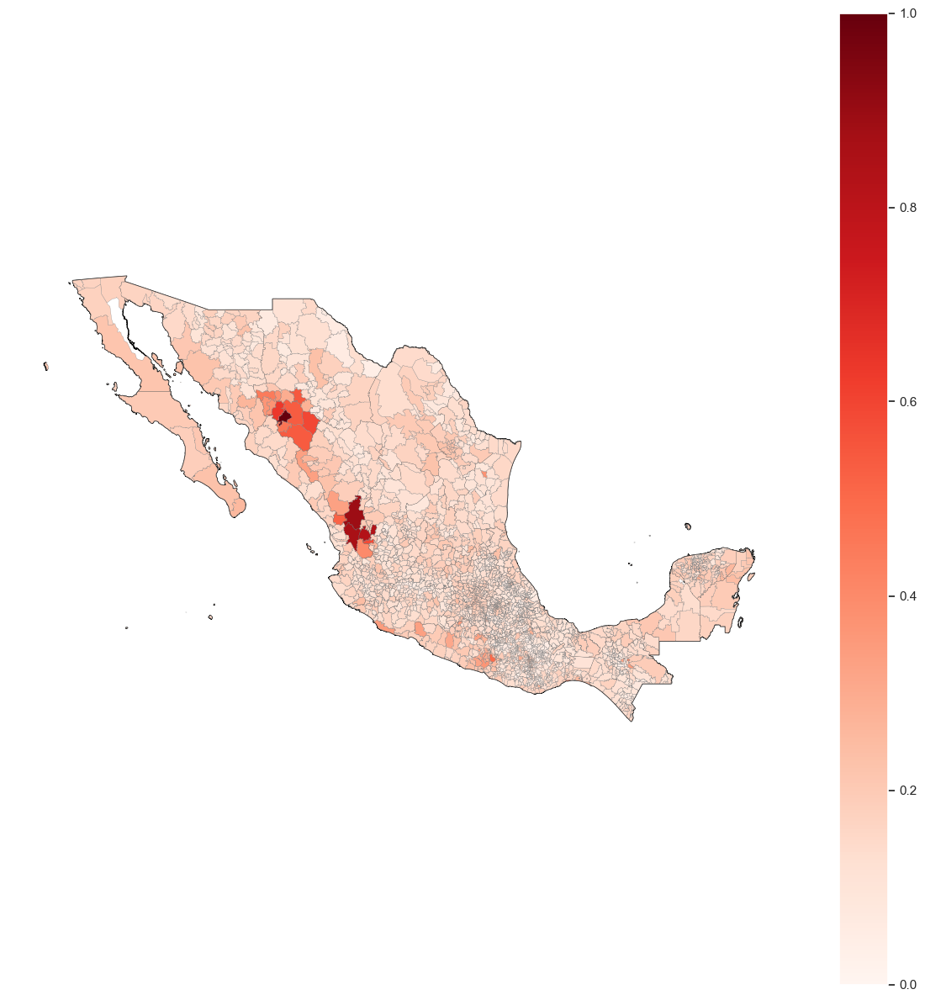

In [176]:
# Lee la cartografía
base = gpd.read_file(r'national\national\national_estatal.shp')
layer = gpd.read_file(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = layer.to_crs("EPSG:4326")
base = base.to_crs("EPSG:4326")  # asegurarse de mismo CRS

# Datos del índice de marginación
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x: 'str' for x in lst_str_cols}
marg_municipal = pd.read_excel('IMM_2020_2.xls', sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')

# Une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO', right_on='CVE_MUN')
# Supongamos que el índice numérico se llama 'IMN_2020'
# Asegúrate de usar la columna correcta que contenga valores de 0 a 1
#layer_marg['IMN_2020'] = pd.to_numeric(layer_marg['IMN_2020'], errors='coerce')
layer_marg['IMN 2020'] = pd.to_numeric(layer_marg['IMN 2020'], errors='coerce')

# Grafica
fig, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')

# Mapa de entidades (borde)
base.plot(color='white', edgecolor='black', ax=ax)

# Mapa de municipios con índice continuo
layer_marg.plot(column='IMN 2020', cmap='Reds', legend=True, linewidth=0.2, edgecolor='grey', ax=ax)

# Quitar ejes
ax.set_axis_off()
#plt.savefig("mexico_pc2.png", dpi=300, bbox_inches="tight")
plt.show()

### categorico

C:\Users\a-sal\anaconda3\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver ESRI Shapefile does not support open option INDEX_COL
  return ogr_read(


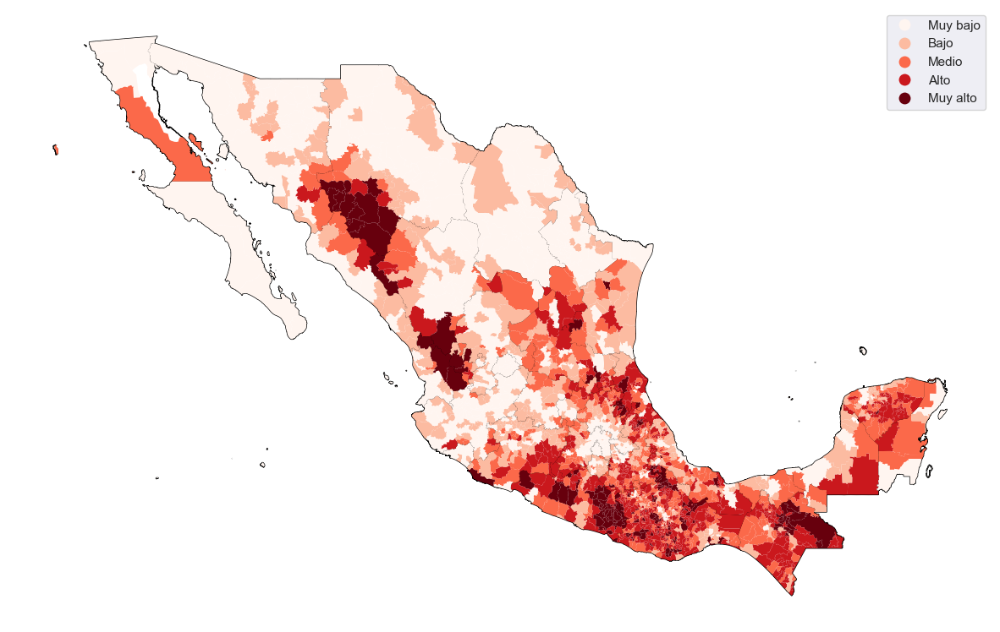

In [178]:
# lee la cartografía de entidades y municipios de México
fileindex = os.path.join(r'national\national\national_estatal.shp')
base = gpd.read_file(fileindex)
fileindex = os.path.join(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = gpd.read_file(fileindex, index_col='CVEGEO')
layer = layer.to_crs("EPSG:4326") # corrige el sistema de coordenadas de referencia para los municipios

# datos del índice de marginación
fileindex = os.path.join('IMM_2020_2.xls')
# especifica el tipo de variable string para los códigos de entidades y municipios
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x : 'str'  for x in lst_str_cols}
marg_municipal = pd.read_excel(fileindex,sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')
# une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO',right_on='CVE_MUN')

for i in range(len(layer_marg['IMN 2020'])):
    if 1 - layer_marg.iloc[i]['IMN 2020'] > 0.87:
        layer_marg.iloc[i]['GM_2020'] == 'Muy bajo'
    elif  0.84 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.87:
        layer_marg.iloc[i]['GM_2020'] == 'Bajo'
    elif 0.82 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.84:
        layer_marg.iloc[i]['GM_2020'] == 'Medio'
    elif 0.763 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.82:
        layer_marg.iloc[i]['GM_2020'] == 'Alto'
    elif 1- layer_marg.iloc[i]['IMN 2020'] <= 0.763:
        layer_marg.iloc[i]['GM_2020'] == 'Muy alto'

# especifica la variable GM_2020 como categórica (el IM en 5 niveles)
im_cat = pd.CategoricalIndex(layer_marg['GM_2020'], categories=['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto'])
# grafica el indicador a nivel municipal
f, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')
# mapa de las entidades de México
base.plot(color='white', edgecolor='black', ax=ax) 
# mapa de los municipios con su IM
layer_marg.plot(column='GM_2020', categorical=True, legend=True, linewidth=0, ax=ax, cmap="Reds", 
           categories = ['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto']) 
# Remove axis
ax.set_axis_off()
#plt.savefig("mexico_pc2_c.png", dpi=300, bbox_inches="tight")
plt.show()


## Tercera componente
### escala [0,1]

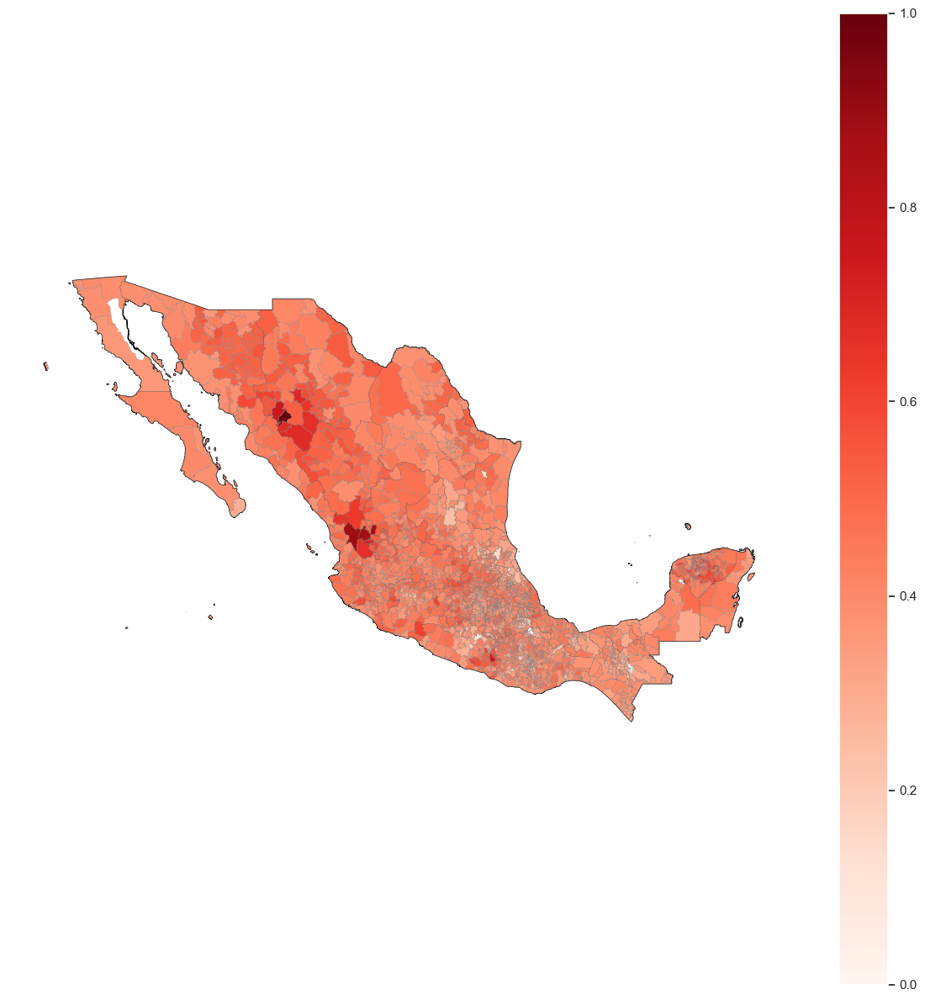

In [184]:
# Lee la cartografía
base = gpd.read_file(r'national\national\national_estatal.shp')
layer = gpd.read_file(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = layer.to_crs("EPSG:4326")
base = base.to_crs("EPSG:4326")  # asegurarse de mismo CRS

# Datos del índice de marginación
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x: 'str' for x in lst_str_cols}
marg_municipal = pd.read_excel('IMM_2020_3.xls', sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')

# Une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO', right_on='CVE_MUN')
# Supongamos que el índice numérico se llama 'IMN_2020'
# Asegúrate de usar la columna correcta que contenga valores de 0 a 1
#layer_marg['IMN_2020'] = pd.to_numeric(layer_marg['IMN_2020'], errors='coerce')
layer_marg['IMN 2020'] = pd.to_numeric(layer_marg['IMN 2020'], errors='coerce')

# Grafica
fig, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')

# Mapa de entidades (borde)
base.plot(color='white', edgecolor='black', ax=ax)

# Mapa de municipios con índice continuo
layer_marg.plot(column='IMN 2020', cmap='Reds', legend=True, linewidth=0.2, edgecolor='grey', ax=ax)

# Quitar ejes
ax.set_axis_off()
#plt.savefig("mexico_pc3.png", dpi=300, bbox_inches="tight")
plt.show()

### categorico

C:\Users\a-sal\anaconda3\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver ESRI Shapefile does not support open option INDEX_COL
  return ogr_read(


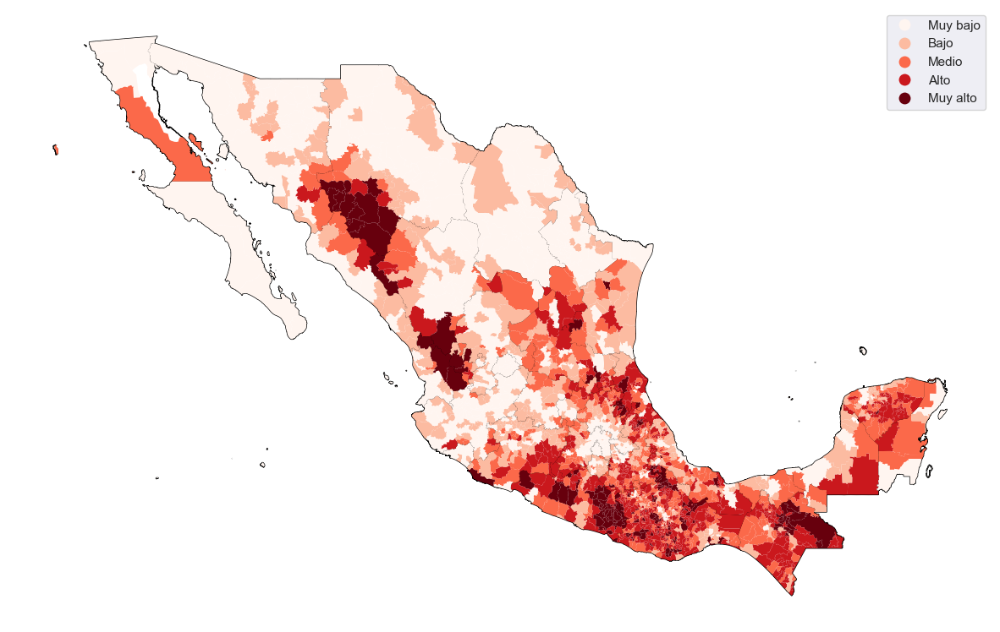

In [186]:
# lee la cartografía de entidades y municipios de México
fileindex = os.path.join(r'national\national\national_estatal.shp')
base = gpd.read_file(fileindex)
fileindex = os.path.join(r'mg2021_integrado_tarea\mg2021_integrado_tarea\conjunto_de_datos\00mun.shp')
layer = gpd.read_file(fileindex, index_col='CVEGEO')
layer = layer.to_crs("EPSG:4326") # corrige el sistema de coordenadas de referencia para los municipios

# datos del índice de marginación
fileindex = os.path.join('IMM_2020_3.xls')
# especifica el tipo de variable string para los códigos de entidades y municipios
lst_str_cols = ['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN']
dict_dtypes = {x : 'str'  for x in lst_str_cols}
marg_municipal = pd.read_excel(fileindex,sheet_name='IMM_2020', dtype=dict_dtypes)
marg_municipal = marg_municipal.set_index('CVE_MUN')
# une la información cartográfica y del IM
layer_marg = layer.merge(marg_municipal, left_on='CVEGEO',right_on='CVE_MUN')

for i in range(len(layer_marg['IMN 2020'])):
    if 1 - layer_marg.iloc[i]['IMN 2020'] > 0.87:
        layer_marg.iloc[i]['GM_2020'] == 'Muy bajo'
    elif  0.84 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.87:
        layer_marg.iloc[i]['GM_2020'] == 'Bajo'
    elif 0.82 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.84:
        layer_marg.iloc[i]['GM_2020'] == 'Medio'
    elif 0.763 < 1 - layer_marg.iloc[i]['IMN 2020'] <= 0.82:
        layer_marg.iloc[i]['GM_2020'] == 'Alto'
    elif 1- layer_marg.iloc[i]['IMN 2020'] <= 0.763:
        layer_marg.iloc[i]['GM_2020'] == 'Muy alto'

# especifica la variable GM_2020 como categórica (el IM en 5 niveles)
im_cat = pd.CategoricalIndex(layer_marg['GM_2020'], categories=['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto'])
# grafica el indicador a nivel municipal
f, ax = plt.subplots(1, figsize=(15, 15))
ax.set_aspect('equal')
# mapa de las entidades de México
base.plot(color='white', edgecolor='black', ax=ax) 
# mapa de los municipios con su IM
layer_marg.plot(column='GM_2020', categorical=True, legend=True, linewidth=0, ax=ax, cmap="Reds", 
           categories = ['Muy bajo', 'Bajo', 'Medio', 'Alto', 'Muy alto']) 
# Remove axis
ax.set_axis_off()
#plt.savefig("mexico_pc3_c.png", dpi=300, bbox_inches="tight")
plt.show()
